In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import copy
import math
from sklearn.model_selection import train_test_split, KFold, cross_validate, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import Pipeline
from scipy.stats import zscore
from scipy.stats import skew


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
# 1. Carregar o dataset e análise exploratória
def load_and_explore_data(filepath):
    data = pd.read_csv(filepath)
    return data

In [3]:
def read_sol(archive_path, archive_csv):
    arquivo_txt = archive_path  # Substitua pelo nome do seu arquivo .txt
    arquivo_csv = archive_csv
    # Lendo o arquivo TXT e convertendo para CSV
    with open(arquivo_txt, "r", encoding="utf-8") as entrada, open(arquivo_csv, "w", newline="", encoding="utf-8") as saida:
        escritor_csv = csv.writer(saida)
        for linha in entrada:
            # Removendo espaços e dividindo pelo tab (\t)
            colunas = linha.strip().split("\t")
            escritor_csv.writerow(colunas)

In [4]:
# read_sol("solTestX.txt", "solTestX.csv")
# read_sol("solTestXtrans.txt", "solTestXtrans.csv")
# read_sol("solTestY.txt", "solTestY.csv")
# read_sol("solTrainX.txt", "solTrainX.csv")
# read_sol("solTrainXtrans.txt", "solTrainXtrans.csv")
# read_sol("solTrainY.txt", "solTrainY.csv")

tsx = load_and_explore_data("datasets/solTestX.csv")
tsfx = load_and_explore_data("datasets/solTestXtrans.csv")
tsy = load_and_explore_data("datasets/solTestY.csv")
tnx = load_and_explore_data("datasets/solTrainX.csv")
tnfx = load_and_explore_data("datasets/solTrainXtrans.csv")
tny = load_and_explore_data("datasets/solTrainY.csv")

In [5]:
print(tsy)

         "x"
"1"     0.93
"2"     0.85
"3"     0.81
"4"     0.74
"5"     0.61
"6"     0.58
"7"     0.57
"8"     0.56
"9"     0.52
"10"    0.45
"11"    0.40
"12"    0.36
"13"    0.22
"14"    0.08
"15"    0.07
"16"    0.02
"17"    0.00
"18"   -0.01
"19"   -0.07
"20"   -0.12
"21"   -0.17
"22"   -0.29
"23"   -0.38
"24"   -0.38
"25"   -0.39
"26"   -0.42
"27"   -0.44
"28"   -0.46
"29"   -0.48
"30"   -0.60
"31"   -0.63
"32"   -0.66
"33"   -0.72
"34"   -0.72
"35"   -0.80
"36"   -0.80
"37"   -0.82
"38"   -0.82
"39"   -0.84
"40"   -0.85
"41"   -0.85
"42"   -0.87
"43"   -0.89
"44"   -0.90
"45"   -0.96
"46"   -0.96
"47"   -0.99
"48"   -1.01
"49"   -1.09
"50"   -1.12
"51"   -1.14
"52"   -1.17
"53"   -1.19
"54"   -1.22
"55"   -1.27
"56"   -1.28
"57"   -1.32
"58"   -1.38
"59"   -1.39
"60"   -1.42
"61"   -1.47
"62"   -1.47
"63"   -1.50
"64"   -1.52
"65"   -1.54
"66"   -1.55
"67"   -1.56
"68"   -1.57
"69"   -1.60
"70"   -1.60
"71"   -1.62
"72"   -1.64
"73"   -1.67
"74"   -1.70
"75"   -1.70
"76"   -1.71

In [6]:
def plotar_histograma_box(data_frame,cor="red",limit = 1000):
  count = 0
  for i in data_frame:
    if count < limit:
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
      # Plota o histograma
      ax1.hist(data_frame[i], bins=20,color=cor, edgecolor='black')
      ax1.set_title(f'Hist. de freq. de {i}')
      ax1.set_xlabel(f'Valores de {i}')
      ax1.set_ylabel('Frequência')
      # Plota o box-plot
      ax2.boxplot(data_frame[i], vert=True)
      ax2.set_title(f'Box-Plot {i}')
      plt.tight_layout()
      plt.savefig(f"graphs/hist/histograma_box_{i}.png")
      plt.close()
      count +=1
    else:
      break

In [7]:
def plotar_histograma_box_grupo(grupo, data_frame,cor="red",limit = 1000):
  count = 0
  for i in data_frame:
    if count < limit:
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
      # Plota o histograma
      ax1.hist(data_frame[i], bins=20,color=cor, edgecolor='black')
      ax1.set_title(f'Hist. de freq. de {i}')
      ax1.set_xlabel(f'Valores de {i}')
      ax1.set_ylabel('Frequência')
      # Plota o box-plot
      ax2.boxplot(data_frame[i], vert=True)
      ax2.set_title(f'Box-Plot {i}')
      plt.tight_layout()
      plt.savefig(f"graphs/hist/histograma_box_{i}_{grupo}.png")
      plt.close()
      count +=1
    else:
      break

In [8]:
plotar_histograma_box(tsx,limit=10)
plotar_histograma_box(tsx)

In [9]:
tsx.describe()

,"""FP001""","""FP002""","""FP003""","""FP004""","""FP005""","""FP006""","""FP007""","""FP008""","""FP009""","""FP010""","""FP011""","""FP012""","""FP013""","""FP014""","""FP015""","""FP016""","""FP017""","""FP018""","""FP019""","""FP020""","""FP021""","""FP022""","""FP023""","""FP024""","""FP025""","""FP026""","""FP027""","""FP028""","""FP029""","""FP030""","""FP031""","""FP032""","""FP033""","""FP034""","""FP035""","""FP036""","""FP037""","""FP038""","""FP039""","""FP040""","""FP041""","""FP042""","""FP043""","""FP044""","""FP045""","""FP046""","""FP047""","""FP048""","""FP049""","""FP050""","""FP051""","""FP052""","""FP053""","""FP054""","""FP055""","""FP056""","""FP057""","""FP058""","""FP059""","""FP060""","""FP061""","""FP062""","""FP063""","""FP064""","""FP065""","""FP066""","""FP067""","""FP068""","""FP069""","""FP070""","""FP071""","""FP072""","""FP073""","""FP074""","""FP075""","""FP076""","""FP077""","""FP078""","""FP079""","""FP080""","""FP081""","""FP082""","""FP083""","""FP084""","""FP085""","""FP086""","""FP087""","""FP088""","""FP089""","""FP090""","""FP091""","""FP092""","""FP093""","""FP094""","""FP095""","""FP096""","""FP097""","""FP098""","""FP099""","""FP100""","""FP101""","""FP102""","""FP103""","""FP104""","""FP105""","""FP106""","""FP107""","""FP108""","""FP109""","""FP110""","""FP111""","""FP112""","""FP113""","""FP114""","""FP115""","""FP116""","""FP117""","""FP118""","""FP119""","""FP120""","""FP121""","""FP122""","""FP123""","""FP124""","""FP125""","""FP126""","""FP127""","""FP128""","""FP129""","""FP130""","""FP131""","""FP132""","""FP133""","""FP134""","""FP135""","""FP136""","""FP137""","""FP138""","""FP139""","""FP140""","""FP141""","""FP142""","""FP143""","""FP144""","""FP145""","""FP146""","""FP147""","""FP148""","""FP149""","""FP150""","""FP151""","""FP152""","""FP153""","""FP154""","""FP155""","""FP156""","""FP157""","""FP158""","""FP159""","""FP160""","""FP161""","""FP162""","""FP163""","""FP164""","""FP165""","""FP166""","""FP167""","""FP168""","""FP169""","""FP170""","""FP171""","""FP172""","""FP173""","""FP174""","""FP175""","""FP176""","""FP177""","""FP178""","""FP179""","""FP180""","""FP181""","""FP182""","""FP183""","""FP184""","""FP185""","""FP186""","""FP187""","""FP188""","""FP189""","""FP190""","""FP191""","""FP192""","""FP193""","""FP194""","""FP195""","""FP196""","""FP197""","""FP198""","""FP199""","""FP200""","""FP201""","""FP202""","""FP203""","""FP204""","""FP205""","""FP206""","""FP207""","""FP208""","""MolWeight""","""NumAtoms""","""NumNonHAtoms""","""NumBonds""","""NumNonHBonds""","""NumMultBonds""","""NumRotBonds""","""NumDblBonds""","""NumAromaticBonds""","""NumHydrogen""","""NumCarbon""","""NumNitrogen""","""NumOxygen""","""NumSulfer""","""NumChlorine""","""NumHalogen""","""NumRings""","""HydrophilicFactor""","""SurfaceArea1""","""SurfaceArea2"""
count,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.00

In [10]:
tsx.skew()

"FP001"                0.127442
"FP002"               -0.348531
"FP003"                0.230437
"FP004"               -0.127442
"FP005"               -0.484051
"FP006"                0.626121
"FP007"                0.611551
"FP008"                0.582671
"FP009"                1.083786
"FP010"                1.562917
"FP011"                1.727567
"FP012"                1.787198
"FP013"                1.818031
"FP014"                1.881902
"FP015"               -1.757053
"FP016"                2.056301
"FP017"                1.983796
"FP018"                2.980161
"FP019"                2.441905
"FP020"                2.544819
"FP021"                2.544819
"FP022"                2.393214
"FP023"                2.980161
"FP024"                2.715186
"FP025"                3.133533
"FP026"                2.393214
"FP027"                3.133533
"FP028"                3.841341
"FP029"                4.118764
"FP030"                3.054833
"FP031"                2.715186
"FP032" 

In [11]:
tsfx.describe()

,"""FP001""","""FP002""","""FP003""","""FP004""","""FP005""","""FP006""","""FP007""","""FP008""","""FP009""","""FP010""","""FP011""","""FP012""","""FP013""","""FP014""","""FP015""","""FP016""","""FP017""","""FP018""","""FP019""","""FP020""","""FP021""","""FP022""","""FP023""","""FP024""","""FP025""","""FP026""","""FP027""","""FP028""","""FP029""","""FP030""","""FP031""","""FP032""","""FP033""","""FP034""","""FP035""","""FP036""","""FP037""","""FP038""","""FP039""","""FP040""","""FP041""","""FP042""","""FP043""","""FP044""","""FP045""","""FP046""","""FP047""","""FP048""","""FP049""","""FP050""","""FP051""","""FP052""","""FP053""","""FP054""","""FP055""","""FP056""","""FP057""","""FP058""","""FP059""","""FP060""","""FP061""","""FP062""","""FP063""","""FP064""","""FP065""","""FP066""","""FP067""","""FP068""","""FP069""","""FP070""","""FP071""","""FP072""","""FP073""","""FP074""","""FP075""","""FP076""","""FP077""","""FP078""","""FP079""","""FP080""","""FP081""","""FP082""","""FP083""","""FP084""","""FP085""","""FP086""","""FP087""","""FP088""","""FP089""","""FP090""","""FP091""","""FP092""","""FP093""","""FP094""","""FP095""","""FP096""","""FP097""","""FP098""","""FP099""","""FP100""","""FP101""","""FP102""","""FP103""","""FP104""","""FP105""","""FP106""","""FP107""","""FP108""","""FP109""","""FP110""","""FP111""","""FP112""","""FP113""","""FP114""","""FP115""","""FP116""","""FP117""","""FP118""","""FP119""","""FP120""","""FP121""","""FP122""","""FP123""","""FP124""","""FP125""","""FP126""","""FP127""","""FP128""","""FP129""","""FP130""","""FP131""","""FP132""","""FP133""","""FP134""","""FP135""","""FP136""","""FP137""","""FP138""","""FP139""","""FP140""","""FP141""","""FP142""","""FP143""","""FP144""","""FP145""","""FP146""","""FP147""","""FP148""","""FP149""","""FP150""","""FP151""","""FP152""","""FP153""","""FP154""","""FP155""","""FP156""","""FP157""","""FP158""","""FP159""","""FP160""","""FP161""","""FP162""","""FP163""","""FP164""","""FP165""","""FP166""","""FP167""","""FP168""","""FP169""","""FP170""","""FP171""","""FP172""","""FP173""","""FP174""","""FP175""","""FP176""","""FP177""","""FP178""","""FP179""","""FP180""","""FP181""","""FP182""","""FP183""","""FP184""","""FP185""","""FP186""","""FP187""","""FP188""","""FP189""","""FP190""","""FP191""","""FP192""","""FP193""","""FP194""","""FP195""","""FP196""","""FP197""","""FP198""","""FP199""","""FP200""","""FP201""","""FP202""","""FP203""","""FP204""","""FP205""","""FP206""","""FP207""","""FP208""","""MolWeight""","""NumAtoms""","""NumNonHAtoms""","""NumBonds""","""NumNonHBonds""","""NumMultBonds""","""NumRotBonds""","""NumDblBonds""","""NumAromaticBonds""","""NumHydrogen""","""NumCarbon""","""NumNitrogen""","""NumOxygen""","""NumSulfer""","""NumChlorine""","""NumHalogen""","""NumRings""","""HydrophilicFactor""","""SurfaceArea1""","""SurfaceArea2"""
count,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.00

In [12]:
tsfx.skew()

"FP001"                0.127442
"FP002"               -0.348531
"FP003"                0.230437
"FP004"               -0.127442
"FP005"               -0.484051
"FP006"                0.626121
"FP007"                0.611551
"FP008"                0.582671
"FP009"                1.083786
"FP010"                1.562917
"FP011"                1.727567
"FP012"                1.787198
"FP013"                1.818031
"FP014"                1.881902
"FP015"               -1.757053
"FP016"                2.056301
"FP017"                1.983796
"FP018"                2.980161
"FP019"                2.441905
"FP020"                2.544819
"FP021"                2.544819
"FP022"                2.393214
"FP023"                2.980161
"FP024"                2.715186
"FP025"                3.133533
"FP026"                2.393214
"FP027"                3.133533
"FP028"                3.841341
"FP029"                4.118764
"FP030"                3.054833
"FP031"                2.715186
"FP032" 

In [13]:
tsy.describe()

,"""x"""
count,316.000000
mean,-2.797025
std,2.078472
min,-10.410000
25%,-3.952500
50%,-2.480000
75%,-1.372500
max,1.070000


In [14]:
tsy.skew()

"x"   -0.737577
dtype: float64

In [15]:
def describe_condiciona_classe(df):
  # Definindo a coluna da classe
  dataframe = copy.deepcopy(df)
  classe_coluna = '"MolWeight"'
  bins = [0, 150, 300, float('inf')]
  labels = ['leve', 'médio', 'pesado']
  # Criando uma nova coluna com os grupos
  dataframe['grupo'] = pd.cut(dataframe[classe_coluna], bins=bins, labels=labels)
  grouped = dataframe.groupby('grupo')
  for nome, grupo in grouped:
    print(f"Resultados para o grupo de peso: {nome}")
    print(grupo.describe())
    group = grupo.select_dtypes(exclude=['category']).columns
    print(df[group].skew())
    print("\n")

In [16]:
describe_condiciona_classe(tsx)

/tmp/ipykernel_23493/4068642675.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = dataframe.groupby('grupo')


Resultados para o grupo de peso: leve
          "FP001"     "FP002"     "FP003"     "FP004"     "FP005"     "FP006"  \
count  127.000000  127.000000  127.000000  127.000000  127.000000  127.000000   
mean     0.330709    0.417323    0.527559    0.385827    0.440945    0.322835   
std      0.472332    0.495070    0.501217    0.488718    0.498467    0.469412   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    1.000000    0.000000    0.000000    0.000000   
75%      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   
max      1.000000    1.000000    1.000000    1.000000    1.000000    1.000000   

          "FP007"     "FP008"     "FP009"     "FP010"     "FP011"     "FP012"  \
count  127.000000  127.000000  127.000000  127.000000  127.000000  127.000000   
mean     0.385827    0.275591    0.110236    0.165354    0.196850    0

In [17]:
dfcorr = tsx.corr()
fig, ax = plt.subplots(figsize=(150, 90))
sns.heatmap(dfcorr, fmt='.2f', square=True, linecolor='white', annot=True, cmap="coolwarm");


In [18]:
def classe_conditional_histogram_box_plot(df,limit=1000):
  # Definindo a coluna da classe
  dataframe = copy.deepcopy(df)
  classe_coluna = '"MolWeight"'
  cores = ["green","blue","red"]
  bins = [0, 121.905, 253.82, float('inf')]
  labels = ['leve', 'médio', 'pesado']
  # Criando uma nova coluna com os grupos
  dataframe['grupo'] = pd.cut(dataframe[classe_coluna], bins=bins, labels=labels)
  grouped = dataframe.groupby('grupo')
  i = 0
  for nome, grupo in grouped:
    print(f"Resultados para o grupo de peso: {nome}")
    grupo = grupo.drop("grupo",axis=1)
    plotar_histograma_box_grupo(nome, grupo, cores[i], limit)
    i += 1

In [19]:
classe_conditional_histogram_box_plot(tsx,limit=10)
classe_conditional_histogram_box_plot(tsx)

/tmp/ipykernel_23493/3766382703.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = dataframe.groupby('grupo')


Resultados para o grupo de peso: leve


Resultados para o grupo de peso: médio
Resultados para o grupo de peso: pesado


/tmp/ipykernel_23493/3766382703.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = dataframe.groupby('grupo')


Resultados para o grupo de peso: leve
Resultados para o grupo de peso: médio
Resultados para o grupo de peso: pesado


In [20]:
def bivariante(df, name):
    pattern = r"\"FP.*\""
    # Cria uma cópia do DataFrame e remove colunas que correspondem ao padrão regex
    dataframe = copy.deepcopy(df)
    dataframe = dataframe.drop(columns=dataframe.filter(regex=pattern).columns)

    for i in dataframe:
        # Filtra as colunas que não são iguais a 'i'
        colunas_validas = [j for j in dataframe if i != j]
        n = len(colunas_validas)

        if n == 0:
            continue

        # Calcula o número de linhas e colunas para os subplots
        ncols = 2  # Define um número fixo de colunas
        nrows = math.ceil(n / ncols)  # Calcula o número de linhas necessário

        # Cria os subplots
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
        axes = axes.flatten()  # Garante acesso linear aos subplots

        for idx, j in enumerate(colunas_validas):
            # Calcula a reta de regressão
            m, b = np.polyfit(dataframe[i], dataframe[j], 1)

            # Plota os pontos e a reta de regressão
            axes[idx].scatter(dataframe[i], dataframe[j], alpha=0.7, label='Dados')
            axes[idx].plot(dataframe[i], m * dataframe[i] + b, color='red', label=f'Reta de Regressão')

            # Configurações do gráfico
            axes[idx].set_xlabel(f'{i}')
            axes[idx].set_ylabel(f'{j}')
            axes[idx].legend()

        # Remove subplots vazios, se houver
        for idx in range(len(colunas_validas), len(axes)):
            fig.delaxes(axes[idx])

        plt.tight_layout()
        plt.savefig(f"graphs/bivariant/bivariant_{name}_{i}.png")
        plt.close()


In [21]:
def bivariante_condicional(dataframe):
  # Definindo a coluna da classe
  dataframe = pd.copy.deepcopy(dataframe)
  classe_coluna = '"MolWeight"'
  bins = [0, 121.905, 253.82, float('inf')]
  labels = ['leve', 'médio', 'pesado']
  # Criando uma nova coluna com os grupos
  dataframe['grupo'] = pd.cut(dataframe[classe_coluna], bins=bins, labels=labels)
  grouped = dataframe.groupby('grupo')
  for nome, grupo in grouped:
    print(f"Resultados para o grupo de peso: {nome}")
    bivariante(grupo.drop("grupo",axis=1), nome)
    print("\n")

In [22]:
bivariante(tsx, "tsx")

In [23]:
def Make_PCA(dataframe):
    pca = PCA().fit(dataframe)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Numero de Componentes encontrados')
    plt.ylabel('Variancia acumulada')
    plt.savefig(f"graphs/PCA/PCA.png")
    plt.close()
    return pca

In [24]:
pca = Make_PCA(tsfx)

In [25]:
def scree_plot(pca):
    plt.figure(figsize=(8, 5))
    plt.bar(['PC1', 'PC2'], pca.explained_variance_ratio_[:2], color='blue', alpha=0.7)
    plt.title('Scree Plot - 2 Componentes Principais')
    plt.xlabel('Componentes Principais')
    plt.ylabel('Variância Explicada')
    plt.ylim(0, 1)
    plt.grid(axis='y', linestyle='-', alpha=0.5)
    plt.savefig(f"graphs/PCA/PCA_1e2.png")
    plt.close()

In [26]:
# 2. Regressão Linear Ordinária (implementação do zero e com sklearn)
def ols_regression(train_X, train_y, test_X, test_y):
    # Implementação do zero
    X = np.c_[np.ones(train_X.shape[0]), train_X]
    beta = np.linalg.inv(X.T @ X) @ X.T @ train_y
    predictions = np.c_[np.ones(test_X.shape[0]), test_X] @ beta

    rmse = np.sqrt(mean_squared_error(test_y, predictions))
    r2 = r2_score(test_y, predictions)
    print(f"OLS do zero - RMSE: {rmse:.4f}, R2: {r2:.4f}")

    # Usando sklearn
    model = LinearRegression()
    model.fit(train_X, train_y)
    sk_predictions = model.predict(test_X)

    sk_rmse = np.sqrt(mean_squared_error(test_y, sk_predictions))
    sk_r2 = r2_score(test_y, sk_predictions)
    print(f"OLS sklearn - RMSE: {sk_rmse:.4f}, R2: {sk_r2:.4f}")

    return [model, beta, predictions]

In [27]:
def ols_predict(beta, X):
    predictions = np.column_stack((np.ones(X.shape[0]), X)) @ beta
    return predictions

In [28]:
[model_ols, beta_ols, pred_ols] = ols_regression(tnfx, tny, tsfx, tsy)


OLS do zero - RMSE: 0.7456, R2: 0.8709
OLS sklearn - RMSE: 0.7456, R2: 0.8709


In [29]:
print("results")
print(tsy)
print("Predictions")
print(pred_ols)

results
         "x"
"1"     0.93
"2"     0.85
"3"     0.81
"4"     0.74
"5"     0.61
"6"     0.58
"7"     0.57
"8"     0.56
"9"     0.52
"10"    0.45
"11"    0.40
"12"    0.36
"13"    0.22
"14"    0.08
"15"    0.07
"16"    0.02
"17"    0.00
"18"   -0.01
"19"   -0.07
"20"   -0.12
"21"   -0.17
"22"   -0.29
"23"   -0.38
"24"   -0.38
"25"   -0.39
"26"   -0.42
"27"   -0.44
"28"   -0.46
"29"   -0.48
"30"   -0.60
"31"   -0.63
"32"   -0.66
"33"   -0.72
"34"   -0.72
"35"   -0.80
"36"   -0.80
"37"   -0.82
"38"   -0.82
"39"   -0.84
"40"   -0.85
"41"   -0.85
"42"   -0.87
"43"   -0.89
"44"   -0.90
"45"   -0.96
"46"   -0.96
"47"   -0.99
"48"   -1.01
"49"   -1.09
"50"   -1.12
"51"   -1.14
"52"   -1.17
"53"   -1.19
"54"   -1.22
"55"   -1.27
"56"   -1.28
"57"   -1.32
"58"   -1.38
"59"   -1.39
"60"   -1.42
"61"   -1.47
"62"   -1.47
"63"   -1.50
"64"   -1.52
"65"   -1.54
"66"   -1.55
"67"   -1.56
"68"   -1.57
"69"   -1.60
"70"   -1.60
"71"   -1.62
"72"   -1.64
"73"   -1.67
"74"   -1.70
"75"   -1.70
"76"

In [30]:
# Validação cruzada k-fold
def k_fold_validation(model, X, y, k):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    rmse_scores = []
    r2_scores = []

    for train_idx, val_idx in kf.split(X):
        train_X, val_X = X.iloc[train_idx], X.iloc[val_idx]
        train_y, val_y = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(train_X, train_y)
        predictions = model.predict(val_X)

        rmse_scores.append(np.sqrt(mean_squared_error(val_y, predictions)))
        r2_scores.append(r2_score(val_y, predictions))

    print(f"Validação cruzada (k={k}) - RMSE médio: {np.mean(rmse_scores):.4f}, R2 médio: {np.mean(r2_scores):.4f}")



In [31]:
k_fold_validation(model_ols, tnfx, tny, 8)

Validação cruzada (k=8) - RMSE médio: 0.7073, R2 médio: 0.8726


In [32]:
# 3. Regressão penalizada (Ridge/Lasso)
def penalized_regression(train_X, train_y, test_X, test_y, penalty='ridge', lambdas=None):
    if lambdas is None:
        lambdas = np.logspace(-3, 3, 10)

    best_lambda = None
    best_rmse = float('inf')

    for l in lambdas:
        if penalty == 'ridge':
            model = Ridge(alpha=l)
        elif penalty == 'lasso':
            model = Lasso(alpha=l)
        else:
            raise ValueError("Penalidade deve ser 'ridge' ou 'lasso'")

        model.fit(train_X, train_y)
        predictions = model.predict(test_X)
        rmse = np.sqrt(mean_squared_error(test_y, predictions))

        if rmse < best_rmse:
            best_rmse = rmse
            best_lambda = l

    print(f"Melhor {penalty} - Lambda: {best_lambda}, RMSE: {best_rmse:.4f}")
    return best_lambda


In [33]:
penalized_regression(tnfx, tny, tsfx, tsy, 'ridge')

Melhor ridge - Lambda: 10.0, RMSE: 0.7094


np.float64(10.0)

In [34]:
def ols_regression_pcr(train_X, train_y, test_X, test_y):
    # Implementação do zero
    X = np.c_[np.ones(train_X.shape[0]), train_X]
    beta = np.linalg.inv(X.T @ X) @ X.T @ train_y
    predictions = np.c_[np.ones(test_X.shape[0]), test_X] @ beta

    # Usando sklearn
    model = LinearRegression()
    model.fit(train_X, train_y)
    sk_predictions = model.predict(test_X)

    return [model, beta]

In [35]:
def components_selection(X, y):
    # Número máximo de componentes a considerar (geralmente, o número de variáveis preditoras)
    max_componentes = 25

    # Configuração da validação cruzada
    cv = KFold(n_splits=5, shuffle=True, random_state=42)

    r2_list = []  # Armazenará o R^2 médio para cada número de componentes
    componentes = range(1, max_componentes + 1)

    for n in componentes:
        # Pipeline: primeiro aplica PCA com n componentes e depois ajusta a regressão linear
        pcr = Pipeline([
            ('pca', PCA(n_components=n)),
            ('lr', LinearRegression())
        ])
        
        # cross_val_score com scoring R^2; valores mais altos indicam melhor performance
        r2_scores = cross_val_score(pcr, X, y, scoring='r2', cv=cv)
        avg_r2 = np.mean(r2_scores)
        
        r2_list.append(avg_r2)
        print(f"Número de Componentes: {n}, R^2: {avg_r2:.4f}")

    # Seleciona o número de componentes que maximiza o R^2
    best_components = componentes[np.argmax(r2_list)]
    print("\nNúmero de componentes ideal:", best_components)

    # Opcional: plotar o R^2 em função do número de componentes
    plt.figure(figsize=(8, 5))
    plt.plot(componentes, r2_list, marker='o', linestyle='--')
    plt.xlabel("Número de Componentes")
    plt.ylabel("R^2")
    plt.title("Seleção do Número Ideal de Componentes para PCR (R^2)")
    plt.grid(True)
    plt.show()

Número de Componentes: 1, R^2: 0.0534
Número de Componentes: 2, R^2: 0.3491
Número de Componentes: 3, R^2: 0.5472
Número de Componentes: 4, R^2: 0.5454
Número de Componentes: 5, R^2: 0.5647
Número de Componentes: 6, R^2: 0.6460
Número de Componentes: 7, R^2: 0.6617
Número de Componentes: 8, R^2: 0.6879
Número de Componentes: 9, R^2: 0.7379
Número de Componentes: 10, R^2: 0.7630
Número de Componentes: 11, R^2: 0.7739
Número de Componentes: 12, R^2: 0.7761
Número de Componentes: 13, R^2: 0.7819
Número de Componentes: 14, R^2: 0.7879
Número de Componentes: 15, R^2: 0.7876
Número de Componentes: 16, R^2: 0.8173
Número de Componentes: 17, R^2: 0.8190
Número de Componentes: 18, R^2: 0.8198
Número de Componentes: 19, R^2: 0.8207
Número de Componentes: 20, R^2: 0.8207
Número de Componentes: 21, R^2: 0.8400
Número de Componentes: 22, R^2: 0.8400
Número de Componentes: 23, R^2: 0.8413
Número de Componentes: 24, R^2: 0.8416
Número de Componentes: 25, R^2: 0.8407

Número de componentes ideal: 24


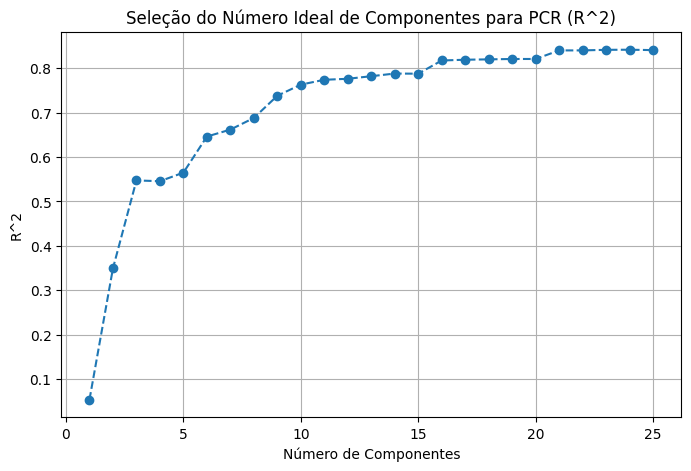

In [36]:
components_selection(tnfx, tny)

In [ ]:
# 4. PCR

def pcr(train_X, train_y, test_X, test_y, nc=24):
    if nc is None:
        nc = min(train_X.shape[1], 10)

    pca = PCA(n_components=nc)
    train_X_reduced = pca.fit_transform(train_X)
    test_X_reduced = pca.transform(test_X)
    [model, beta] = ols_regression_pcr(train_X_reduced, train_y, test_X_reduced, test_y)
    predictions = ols_predict(beta, test_X_reduced)
    rmse = np.sqrt(mean_squared_error(test_y, predictions))
    return [model, rmse, beta, test_X_reduced, predictions]

In [38]:
[model_pcr, rmse_pcr, beta_pcr, x_reduced, pred_pcr] = pcr(tnfx, tny, tsfx, tsy)

In [39]:
rmse_pcr = np.sqrt(mean_squared_error(tsy, pred_pcr))
r2_pcr = r2_score(tsy, pred_pcr)
print("RMSE PCR: " + str(rmse_pcr))
print("R2 PCR: " + str(r2_pcr))

RMSE PCR: 0.9456495234150514
R2 PCR: 0.7923420619604452


In [40]:
tny2 = tny.values.ravel()
mlp = model = MLPRegressor(hidden_layer_sizes=(100,),
                     activation='logistic',
                     solver='sgd',
                     max_iter=1000,
                     random_state=42)
cv_10 = KFold(n_splits=10, shuffle=True, random_state=42)
scoring = ['r2', 'neg_root_mean_squared_error']
scores = cross_validate(mlp, tnfx, tny2, cv=cv_10, scoring=scoring, return_estimator=True)

print('Média do R² na validação cruzada:', scores['test_r2'].mean())
print('Média do RMSE na validação cruzada:', -scores['test_neg_root_mean_squared_error'].mean())

best_model = scores['estimator'][4]  
y_pred_test = best_model.predict(tsfx)
r2_test = r2_score(tsy, y_pred_test)
rmse_test = np.sqrt(mean_squared_error(tsy, y_pred_test))

print('R² no conjunto de teste:', r2_test)
print('RMSE no conjunto de teste:', rmse_test)


/mnt/c/Users/rodri/OneDrive - Universidade Federal do Ceará/Documentos/HW2/my-venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/mnt/c/Users/rodri/OneDrive - Universidade Federal do Ceará/Documentos/HW2/my-venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/mnt/c/Users/rodri/OneDrive - Universidade Federal do Ceará/Documentos/HW2/my-venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/mnt/c/Users/rodri/OneDrive - Universidade Federal do Ceará/Documentos/HW2/my-venv/lib/python3

Média do R² na validação cruzada: 0.8779868954549311
Média do RMSE na validação cruzada: 0.6961740979282862
R² no conjunto de teste: 0.8768475674079114
RMSE no conjunto de teste: 0.7282448745827222


/mnt/c/Users/rodri/OneDrive - Universidade Federal do Ceará/Documentos/HW2/my-venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
